# Purchase Data Descriptive Analysis

## Packages

In [1]:
import numpy as np
import pandas as pd
import joblib
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import matplotlib
%matplotlib inline
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="white", rc=custom_params,palette='Set1')
# # Configuring styles
# matplotlib.rcParams['font.size'] = 14
# matplotlib.rcParams['figure.figsize'] = (9, 7)
# matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Load Data

In [2]:
purchase = pd.read_csv('purchase.csv',index_col=0)

## Exploratory Data Analysis

In [3]:
profile = ProfileReport(purchase, title="Purchase Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Segmentation

In [4]:
scaler = joblib.load('scaler.jbl')
pca = joblib.load('pca.jbl')
k_means = joblib.load('kmeans_pca.jbl')

In [5]:
customers = purchase[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']]
purchase_segm_std = scaler.transform(customers)

In [6]:
#PCA
purchase_segm_pca = pca.transform(purchase_segm_std)

In [7]:
# Clustering
purchase_segm_kmeans_pca = k_means.predict(purchase_segm_pca)

In [8]:
df_purchase_predictors = purchase.copy()
df_purchase_predictors['Segment'] = purchase_segm_kmeans_pca

In [9]:
# Adding Segment Names
df_purchase_predictors['Segment Names'] = df_purchase_predictors['Segment'].map({0:'standard', 
                                                          1:'career focused',
                                                          2:'fewer opportunities', 
                                                          3:'well-off'})

### Segment Proportion

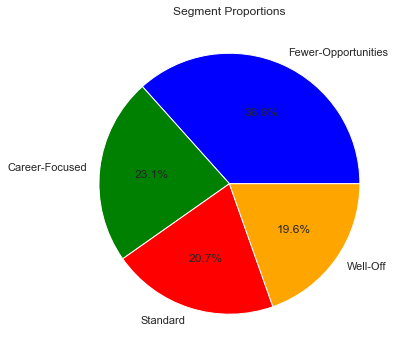

In [10]:
plt.figure(figsize = (9, 6))
plt.pie(df_purchase_predictors['Segment Names'].value_counts(),
        labels = [ 'Fewer-Opportunities','Career-Focused','Standard', 'Well-Off'],
        autopct = '%1.1f%%', 
        colors = ('b', 'g', 'r', 'orange'))
plt.title('Segment Proportions');

### Analysis by Customers

In [11]:
purchase_descr = df_purchase_predictors.index.value_counts(sort=False).rename_axis('ID').to_frame('Visits')
purchase_descr['Purchases'] = df_purchase_predictors['Incidence'].groupby(df_purchase_predictors.index).sum()

In [12]:
purchase_descr['Average Purchase'] = purchase_descr['Purchases'] / purchase_descr['Visits']
purchase_descr = purchase_descr.join(df_purchase_predictors['Segment'].groupby(df_purchase_predictors.index).max())

In [13]:
purchase_descr['Segment Names'] = purchase_descr['Segment'].map({0:'standard', 
                                                          1:'career focused',
                                                          2:'fewer opportunities', 
                                                          3:'well-off'})
purchase_descr.head()

,Visits,Purchases,Average Purchase,Segment,Segment Names
ID,,,,,
200000001,101,9,0.089109,2,fewer opportunities
200000002,87,11,0.126437,3,well-off
200000003,97,10,0.103093,2,fewer opportunities
200000004,85,11,0.129412,2,fewer opportunities
200000005,111,13,0.117117,1,career focused


### Customers Visits by Segment

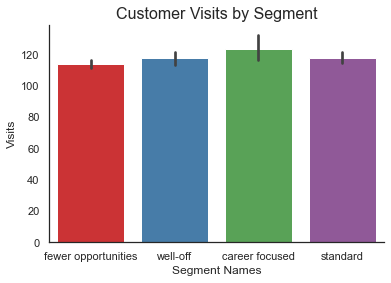

In [14]:
sns.barplot(data=purchase_descr,x='Segment Names',y='Visits')
plt.title('Customer Visits by Segment',fontsize=16);

### Customers Purchases by Segment

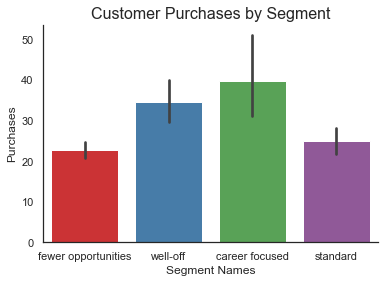

In [15]:
sns.barplot(data=purchase_descr,x='Segment Names',y='Purchases')
plt.title('Customer Purchases by Segment',fontsize=16);

## Brand Choice

In [16]:
df_purchase_incidence = df_purchase_predictors[df_purchase_predictors['Incidence'] == 1]
brand_dummies = pd.get_dummies(df_purchase_incidence['Brand'], prefix = 'Brand', prefix_sep = '_')
brand_dummies['Segment'], = df_purchase_incidence['Segment'],
brand_dummies

,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5,Segment
ID,,,,,,
200000001,0,1,0,0,0,2
200000001,0,0,0,0,1,2
200000001,1,0,0,0,0,2
200000001,0,0,0,1,0,2
200000001,0,1,0,0,0,2
...,...,...,...,...,...,...
200000500,0,1,0,0,0,2
200000500,1,0,0,0,0,2
200000500,0,1,0,0,0,2


In [17]:
mean_brand_choice = brand_dummies.groupby(['Segment'], as_index = True).mean()
mean_brand_choice.style.background_gradient(cmap=sns.light_palette("green", as_cmap=True),axis=1)

,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
Segment,,,,,
0,0.205458,0.353996,0.203119,0.049513,0.187914
1,0.039489,0.092901,0.026250,0.079206,0.762155
2,0.118112,0.687747,0.027203,0.061381,0.105557
3,0.041876,0.079328,0.025951,0.645532,0.207313


* Segment 0 prefer brand 1, 2 and 3
* Segment 1 prefer Brand 5
* Segment 2 prefer Brand 2
* Segment 3 prefer Brand 4

## Revenue

### Revenue Generated by Brand and Segment

In [18]:
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 1]
temp.loc[:, 'Revenue Brand 1'] = temp['Price_1'] * temp['Quantity']
segments_brand_revenue = pd.DataFrame()
segments_brand_revenue[['Segment', 'Revenue Brand 1']] = temp[['Segment', 'Revenue Brand 1']].groupby(['Segment'], as_index = False).sum()
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 2]
temp.loc[:, 'Revenue Brand 2'] = temp['Price_2'] * temp['Quantity']
segments_brand_revenue[['Segment', 'Revenue Brand 2']] = temp[['Segment', 'Revenue Brand 2']].groupby(['Segment'], as_index = False).sum()

In [19]:
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 3]
temp.loc[:,'Revenue Brand 3'] = temp['Price_3']*temp['Quantity']
segments_brand_revenue[['Segment','Revenue Brand 3']] = temp[['Revenue Brand 3','Segment']].groupby(['Segment'], as_index = False).sum()
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 4]
temp.loc[:,'Revenue Brand 4'] = temp['Price_4']*temp['Quantity']
segments_brand_revenue[['Segment','Revenue Brand 4']] = temp[['Revenue Brand 4','Segment']].groupby(['Segment'], as_index = False).sum()

In [20]:
temp = df_purchase_predictors[df_purchase_predictors['Brand'] == 5]
temp.loc[:,'Revenue Brand 5'] = temp['Price_5']*temp['Quantity']
segments_brand_revenue[['Segment','Revenue Brand 5']] = temp[['Revenue Brand 5','Segment']].groupby(['Segment'], as_index = False).sum()

In [21]:
segments_brand_revenue['Total Revenue'] = (segments_brand_revenue['Revenue Brand 1'] +
                                           segments_brand_revenue['Revenue Brand 2'] +
                                           segments_brand_revenue['Revenue Brand 3'] +
                                           segments_brand_revenue['Revenue Brand 4'] +
                                           segments_brand_revenue['Revenue Brand 5'] )

In [22]:
segments_brand_revenue['Segment Names'] =segments_brand_revenue['Segment'].map({0:'standard', 
                                                          1:'career focused',
                                                          2:'fewer opportunities', 
                                                          3:'well-off'})
segments_brand_revenue =segments_brand_revenue.set_index('Segment Names')

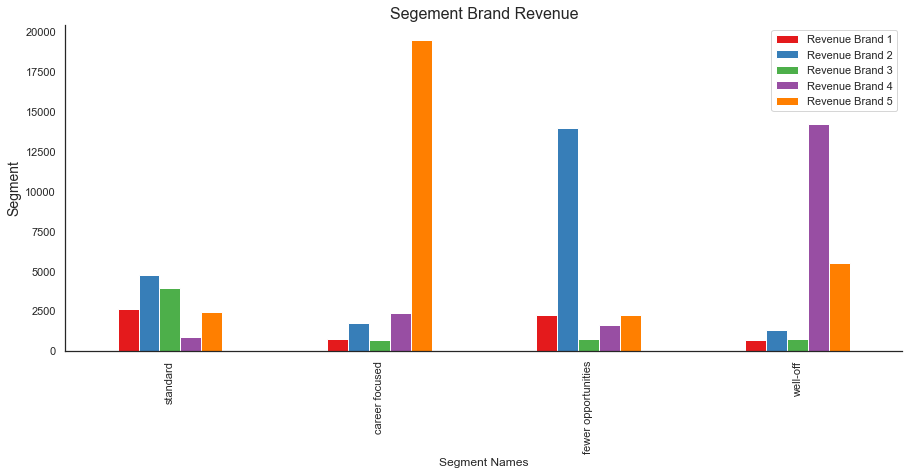

In [23]:
segments_brand_revenue.iloc[:,1:-1].plot(kind='bar',figsize=(15,6))
plt.title('Segement Brand Revenue',fontsize=16)
plt.ylabel('Revenue',fontsize=14)
plt.ylabel('Segment',fontsize=14);

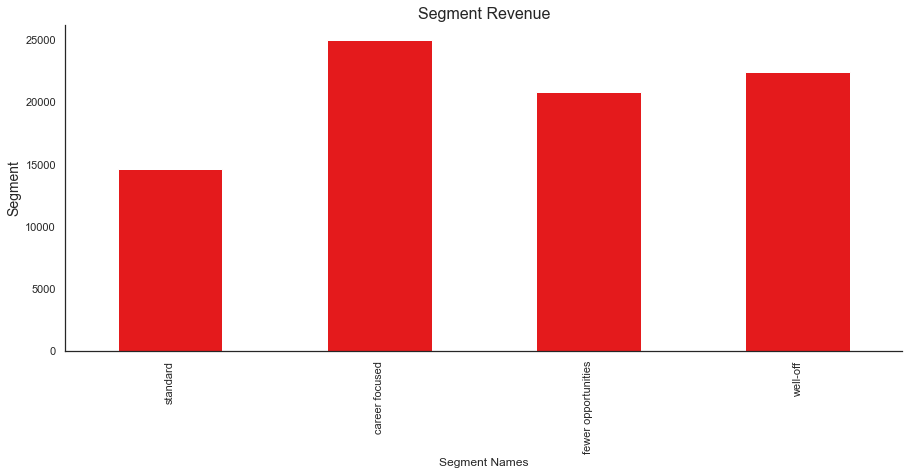

In [24]:
segments_brand_revenue.iloc[:,-1].plot(kind='bar',figsize=(15,6))
plt.title('Segment Revenue',fontsize=16)
plt.ylabel('Revenue',fontsize=14)
plt.ylabel('Segment',fontsize=14);

In [26]:
df_purchase_predictors.to_csv('purchase_segmented.csv')